# Fibroblast to neuron

In [1]:
import phlower
import numpy as np
import pandas as pd
import networkx as nx
from itertools import chain
import scipy
import sklearn
import pydot
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import scanpy as sc
from matplotlib.backends.backend_pdf import PdfPages


In [2]:
%load_ext autoreload
%autoreload 2
import phlower
import importlib
importlib.reload(phlower)
phlower.__version__

'0.1.3'

In [3]:
adata = phlower.dataset.fib2neuro()

### ddhodge to get embeddings and pseudo time

#### Parameters
`basis`: will perform PCA if set to None

`root`: start cell indecies for trajectory

`k`: bandwith for diffusion map affinity

`npc`: number of PCs to use

`ndc`: number of diffusion components to use

`s`: steps for diffusion process

`lstsq_methods`: least square methods for ddhodge potential calculation


In [4]:
phlower.ext.ddhodge(adata, basis=None, roots=(adata.obs.group=="MEF"), k=7,npc=100,ndc=40,s=2, lstsq_method='cholesky', verbose=True)

Normalization: 
done.
Pre-PCA: 
2023-07-13 10:51:42.613424 distance_matrix
2023-07-13 10:51:42.660394 Diffusionmaps: 
done.
2023-07-13 10:51:42.759697 diffusion distance:
2023-07-13 10:51:42.778532 transition matrix:
2023-07-13 10:51:42.778546 1
2023-07-13 10:51:42.780651 2
2023-07-13 10:51:42.780922 3
2023-07-13 10:51:42.791378 graph from A
2023-07-13 10:51:42.791543 5
2023-07-13 10:51:42.791553 Rewiring: 
2023-07-13 10:51:42.791559 div(g_o)...


/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/phlower/util.py:400: CholmodTypeConversionWarning: converting matrix of class csr_array to CSC format
  solve = cholesky( A, beta=beta )  # A + beta I


2023-07-13 10:51:42.985861 connected graph k= 7
2023-07-13 10:51:42.985933 edge weight...
2023-07-13 10:51:43.032531 cholesky solve ax=b...
+ 1e-06 I is positive-definite
2023-07-13 10:51:43.040454 grad...
2023-07-13 10:51:43.157347 ddhodge done.
done.
2023-07-13 10:51:43.272232 calculate layouts
2023-07-13 10:51:50.967926 done


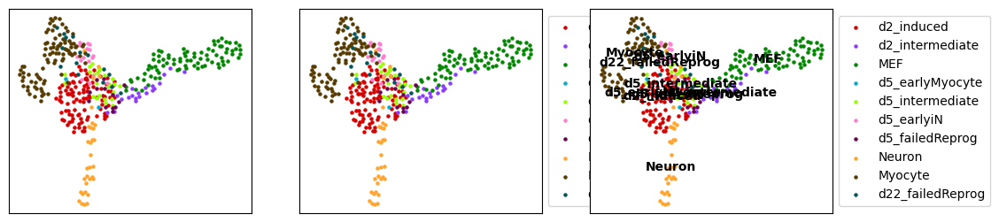

In [5]:

figs = []
fig, ax = plt.subplots(1,3, figsize=(12, 3))
phlower.pl.nxdraw_group(adata,node_size=5, show_edges=False, label=False, show_legend=False, ax=ax[0])
phlower.pl.nxdraw_group(adata,node_size=5, show_edges=False, label=False,ax=ax[1])
phlower.pl.nxdraw_group(adata,node_size=5, show_edges=False, ax=ax[2], labelstyle='text')

### Delaunay triangulation to construct graph with holes

`cluster_name`: clusters to use, i.e. leiden or louvain

`node_attr`: pseudo time from ddhodge

`start_n, end_n`: how many cells to use to connect start and and clusters 

`circle_quant`: quantile cells of each cluster to use for the starts ends connecting

`calc_layout`: if calculate layout using neato for the graph with holes

In [6]:
phlower.tl.construct_delaunay(adata, cluster_name='group', node_attr='u', start_n=10, end_n=10, circle_quant=0.1, calc_layout=True)

start clusters  ['MEF']
end clusters  ['Neuron', 'Myocyte']


Now we can check the graph with holes and how pseudo time presents in the graph

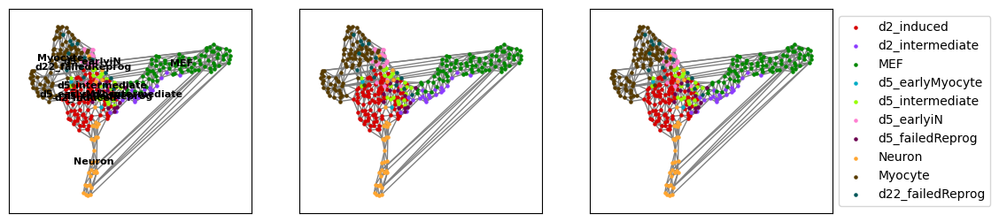

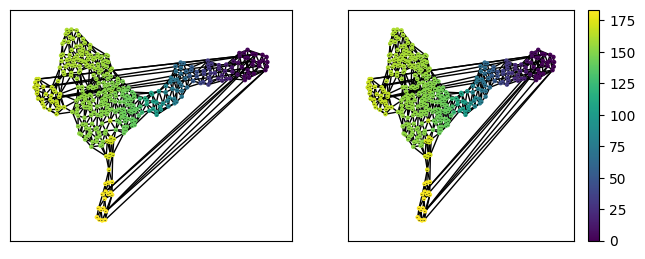

In [7]:
fig, ax = plt.subplots(1,3, figsize=(12, 3))
phlower.pl.nxdraw_group(adata, graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5, show_edges=True, show_legend=False, labelstyle='text', labelsize=8, ax=ax[0])
phlower.pl.nxdraw_group(adata,  graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5, show_edges=True, show_legend=False, labelstyle='text', labelsize=8, label=False, ax=ax[1])
phlower.pl.nxdraw_group(adata,  graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5, show_edges=True, show_legend=True, labelstyle='text', labelsize=8, label=False, ax=ax[2])


fig, ax = plt.subplots(1,2, figsize=(8,3))
phlower.pl.nxdraw_score(adata, graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5,  ax=ax[0])
phlower.pl.nxdraw_score(adata, graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5,  ax=ax[1], colorbar=False)


We can als check the graph with holes and the triangle distributions

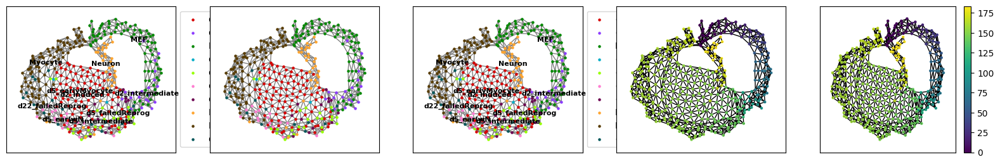

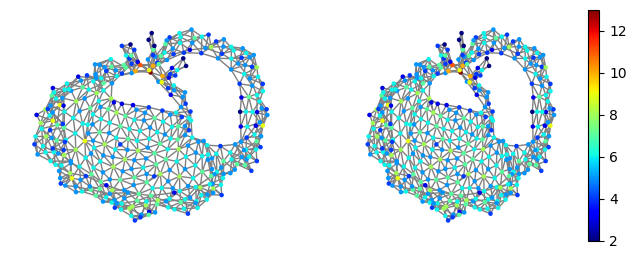

In [8]:
figs = []

fig, ax = plt.subplots(1,5, figsize=(20, 3))
phlower.pl.nxdraw_group(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle',node_size=5, show_edges=True, labelstyle='text',labelsize=8, show_legend=True, ax = ax[0])
phlower.pl.nxdraw_group(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle',node_size=5, show_edges=True, labelstyle='text',labelsize=8, show_legend=False, label=False, ax=ax[1])
phlower.pl.nxdraw_group(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle',node_size=5, show_edges=True, labelstyle='text',labelsize=8, show_legend=True, ax = ax[2])
phlower.pl.nxdraw_score(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle',node_size=5, ax = ax[3])
phlower.pl.nxdraw_score(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle', colorbar=False,node_size=5, label=False, ax=ax[4])


fig, ax = plt.subplots(1,2, figsize=(8, 3))
phlower.pl.plot_triangle_density(adata, "X_pca_ddhodge_g_triangulation_circle", "X_pca_ddhodge_g_triangulation_circle", edge_color='gray', ax=ax[0], node_size=5)
phlower.pl.plot_triangle_density(adata, "X_pca_ddhodge_g_triangulation_circle", "X_pca_ddhodge_g_triangulation_circle", colorbar=False, edge_color='gray', ax = ax[1], node_size=5)


### Graph holdge laplacian
In here, we first get normlized hodge laplacian and perform eigen decomposition to get the signals on edges

In [9]:
phlower.tl.L1Norm_decomp(adata, L1_mode='sym', isnorm=True, check_symmetric=True)

0.21748566627502441  sec


We can check the eigen vectors(harmonic) with eigen vectors = 0

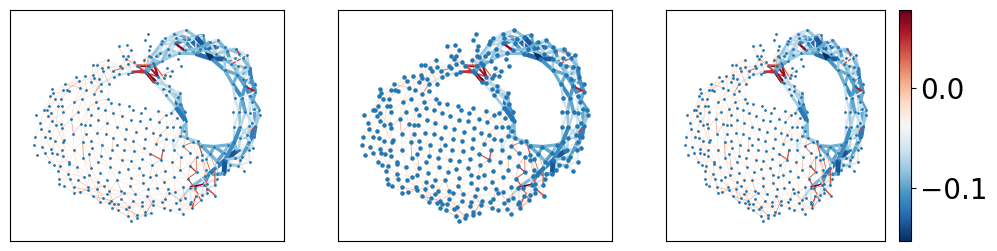

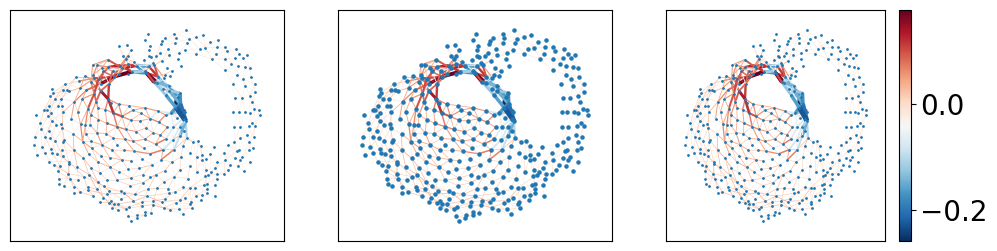

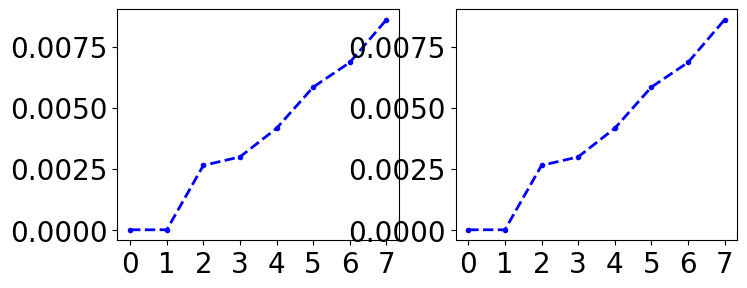

In [41]:
figs = []

fig, ax = plt.subplots(1,3, figsize=(12, 3))
phlower.pl.nxdraw_holes(adata, vector_dim=0,arrows=False, width=4, node_size=1, ax=ax[0])
phlower.pl.nxdraw_holes(adata, vector_dim=0,arrows=False, width=4, node_size=5, ax=ax[1])
phlower.pl.nxdraw_holes(adata, vector_dim=0,arrows=False, width=4, node_size=1, ax=ax[2], colorbar=True)

fig, ax = plt.subplots(1,3, figsize=(12, 3))
phlower.pl.nxdraw_holes(adata, vector_dim=1,arrows=False, width=4, node_size=1, ax=ax[0])
phlower.pl.nxdraw_holes(adata, vector_dim=1,arrows=False, width=4, node_size=5, ax=ax[1])
phlower.pl.nxdraw_holes(adata, vector_dim=1,arrows=False, width=4, node_size=1, ax=ax[2], colorbar=True)


fig, ax = plt.subplots(1,2, figsize=(8, 3))
phlower.pl.plot_eigen_line(adata, n_eig=8, linewidth='2', markersize=3,  show_legend=False, ax=ax[0])
phlower.pl.plot_eigen_line(adata, n_eig=8, linewidth='2', markersize=3,  show_legend=False, ax=ax[1])

We can also check the harmonic 0 and 1 for each edge

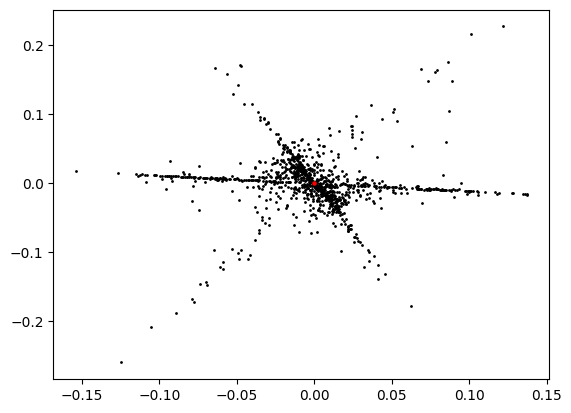

In [11]:
phlower.pl.nxdraw_harmonic(adata, with_potential=None, c='black')

Check how many harmonic functions by checking 0 eigen values 

In [12]:
phlower.tl.knee_eigen(adata)

knee eigen value is  2


### Preference random walk


In [13]:
phlower.tl.random_climb_knn(adata, n=10000)

/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
100%|██████████| 10000/10000 [00:04<00:00, 2148.57it/s]


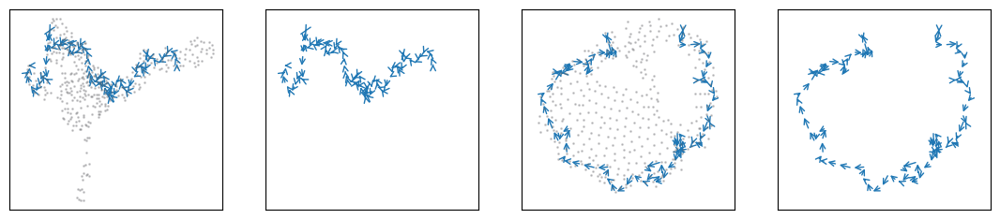

In [14]:
#G_ae.nodes(data=True)
from scipy import constants
fig_width = 9
fig, axs = plt.subplots(1, 4,figsize=(fig_width*1.5, fig_width*0.5 / constants.golden))
phlower.pl.plot_traj(adata, trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=1, ax=axs[0])
phlower.pl.plot_traj(adata, trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=0, ax=axs[1])
phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=1, ax=axs[2])
phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=0, ax=axs[3])

### Project trajectories to harmonic space

In [15]:
phlower.tl.trajs_matrix(adata)

2023-07-13 10:52:22.449264 projecting trajectories to simplics...
2023-07-13 10:52:28.835534 Embedding trajectory harmonics...
eigen_n < 1, use knee_eigen to find the number of eigen vectors to use: 2
eigen_n is 2, use itsself as embedding
2023-07-13 10:52:28.943131 done.


### dbscan clustering on the culmulative trajectory space

In [16]:
from collections import Counter
phlower.tl.trajs_clustering(adata,  eps=0.5)
Counter(adata.uns['trajs_clusters'])

Counter({0: 9271, 1: 729})

In [17]:
c0 = np.where(adata.uns['trajs_clusters'] == 0)[0]
c1 = np.where(adata.uns['trajs_clusters'] == 1)[0]

### plot clustered trajectories on the graph

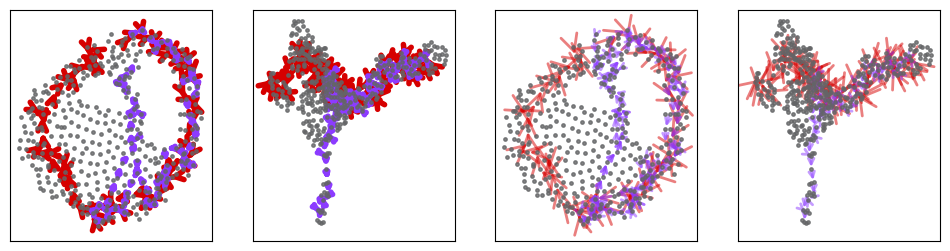

In [18]:
fig1, ax = plt.subplots(1,4, figsize=(12,3))
import colorcet as cc
color_palette = sns.color_palette(cc.glasbey, n_colors=50).as_hex()
phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", trajectory=list(np.array(adata.uns['knn_trajs'], dtype=object)[c0[9]]), colorid=0, node_size=6, alpha_nodes=.8, ax=ax[0], edge_width=4,alpha=1, color_palette=color_palette, arrowsize=15)
def edges_on_path(path):
    return zip(path, path[1:])

for a_traj in list(np.array(adata.uns['knn_trajs'], dtype=object)[c1[[2]]]):
                nx.draw_networkx_edges(adata.uns['X_pca_ddhodge_g_triangulation_circle'],
                                       adata.obsm['X_pca_ddhodge_g_triangulation_circle'],
                                       ax=ax[0],
                                       edgelist=list(edges_on_path(a_traj)),
                                       node_size=10,
                                       width=4,
                                       edge_color=color_palette[1],
                                       arrows=True,
                                       arrowstyle='->',
                                       arrowsize=5,
                                       alpha=1
                                      )
        
        


phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g", trajectory=list(np.array(adata.uns['knn_trajs'],dtype=object)[c0[9]]), colorid=0, node_size=6, alpha_nodes=.8, ax=ax[1], edge_width=4,alpha=1, color_palette=color_palette, arrowsize=15)
for a_traj in list(np.array(adata.uns['knn_trajs'],dtype=object)[c1[[2]]]):
                nx.draw_networkx_edges(adata.uns['X_pca_ddhodge_g_triangulation_circle'],
                                       adata.obsm['X_pca_ddhodge_g'],
                                       ax=ax[1],
                                       edgelist=list(edges_on_path(a_traj)),
                                       node_size=10,
                                       width=4,
                                       edge_color=color_palette[1],
                                       arrows=True,
                                       arrowstyle='->',
                                       arrowsize=5,
                                       alpha=1
                                      )


phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", trajectory=list(np.array(adata.uns['knn_trajs'],dtype=object)[c0[9]]), colorid=0, node_size=6, alpha_nodes=.8, ax=ax[2], edge_width=2,alpha=.5, color_palette=color_palette, arrowsize=30)
for a_traj in list(np.array(adata.uns['knn_trajs'],dtype=object)[c1[:2]]):
                nx.draw_networkx_edges(adata.uns['X_pca_ddhodge_g_triangulation_circle'],
                                       adata.obsm['X_pca_ddhodge_g_triangulation_circle'],
                                       ax=ax[2],
                                       edgelist=list(edges_on_path(a_traj)),
                                       node_size=10,
                                       width=2,
                                       edge_color=color_palette[1],
                                       arrows=True,
                                       arrowstyle='->',
                                       arrowsize=10,
                                       alpha=.5,
                                       
                                      )



phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g", trajectory=list(np.array(adata.uns['knn_trajs'],dtype=object)[c0[9]]), colorid=0, node_size=6, alpha_nodes=.8, ax=ax[3], edge_width=2,alpha=.5, color_palette=color_palette, arrowsize=30)
for a_traj in list(np.array(adata.uns['knn_trajs'],dtype=object)[c1[[2]]]):
                nx.draw_networkx_edges(adata.uns['X_pca_ddhodge_g_triangulation_circle'],
                                       adata.obsm['X_pca_ddhodge_g'],
                                       ax=ax[3],
                                       edgelist=list(edges_on_path(a_traj)),
                                       node_size=10,
                                       width=2,
                                       edge_color=color_palette[1],
                                       arrows=True,
                                       arrowstyle='->',
                                       arrowsize=10,
                                       alpha=.5
                                      )
            

### harmonic space for the two trajectory clusters

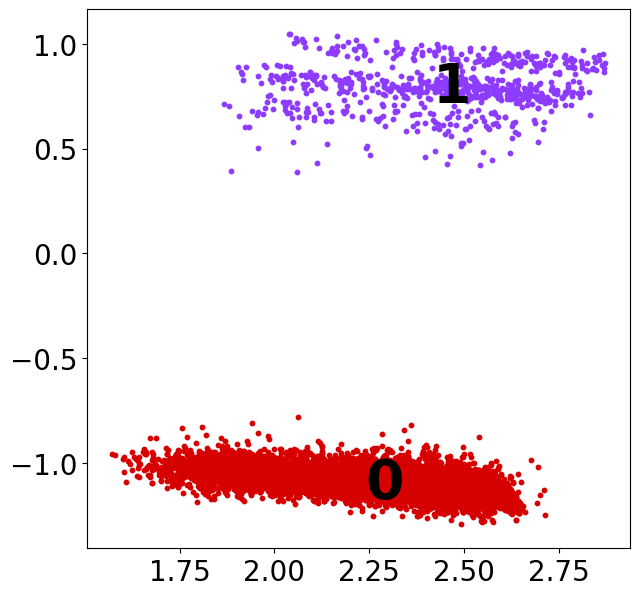

In [19]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

_, ax = plt.subplots(1,1, figsize=(7,7))
phlower.pl.plot_trajs_embedding(adata, clusters="trajs_clusters",show_legend=False, labelsize=40, node_size=10, ax=ax)

### density plots for the two trajectory clusters

/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/phlower/plot/plotting.py:1143: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



z_min, z_max 6.412123379363474e-09 3.081660936540728e-06
z_min, z_max 5.0620293269272995e-08 3.621478784389759e-06


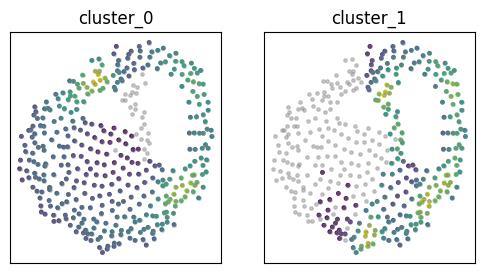

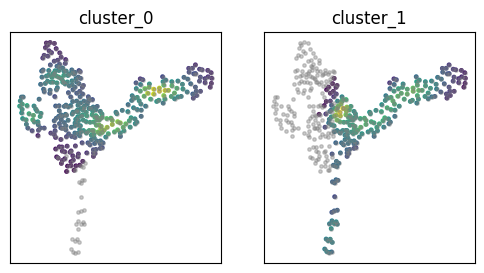

In [36]:
fig1, _ = phlower.pl.plot_density_grid(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", figsize=(6, 3), retain_clusters=[0,1], return_fig=True, bg_alpha=.4, node_size=6)
fig2, _ = phlower.pl.plot_density_grid(adata, layout_name="X_pca_ddhodge_g", figsize=(6, 3), retain_clusters=[0,1], return_fig=True, bg_alpha=.4, node_size=6)

### Create stream tree in harmonic space
`trajs_use`: how many trajectories to use

`trajs_clusters`: trajectory clusters

`min_bin_number`: Bin each trajectory group by pseudo time, the minimu bins for the shortest trajectory

`cut_threshold`: 1 by default, for the tree creating, in the harmonic space.

`eigen_n`: how many harmonic functions to use, default = -1 will use all.

In [21]:
phlower.tl.harmonic_stream_tree(adata,
                                trajs_use=10000,
                                trajs_clusters='trajs_clusters',
                                min_bin_number=20,
                                cut_threshold=1, 
                                eigen_n=-1)

eigen_n < 1, use knee_eigen to find the number of eigen vectors to use
eigen_n: 2
{0, 1}


100%|██████████| 2/2 [00:11<00:00,  5.74s/it]


[(0, 1)]


pseudo time bins for each trajectory group, and the tree created

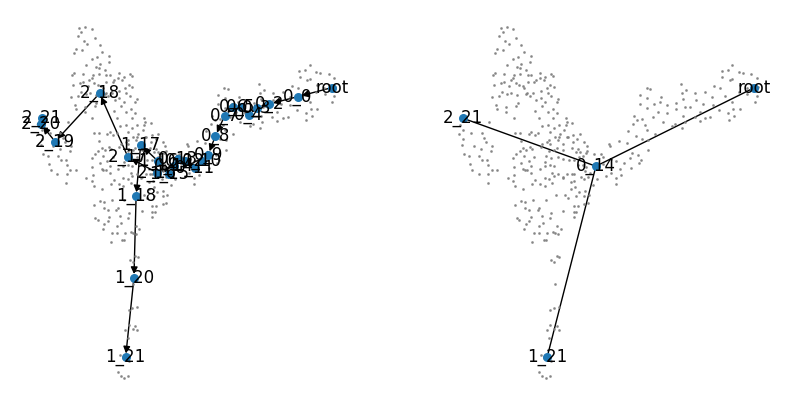

In [22]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
phlower.pl.plot_fate_tree_embedding(adata, fate_tree='fate_tree', ax=ax[0], with_labels=True)
phlower.pl.plot_stream_tree_embedding(adata, stream_tree='stream_tree', ax=ax[1])

Now we can plot the tree using STREAM

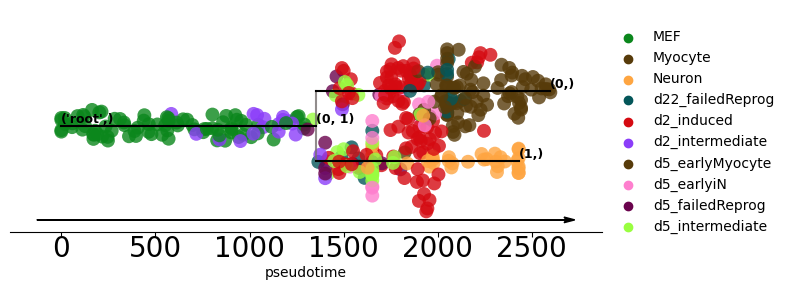

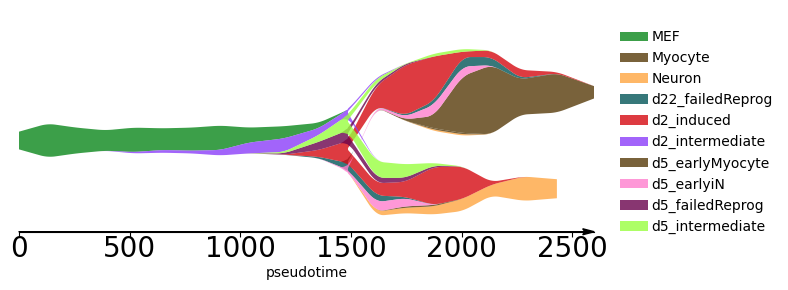

In [35]:
celltype_colors = {
    "MEF": "#0b871c",
    "Neuron": "#fea541",
    "d2_induced": "#d50a11",
    "d2_intermediate": "#8b3df9",
    "d5_earlyMyocyte":"#573b0a",
    "d5_earlyiN":"#fe7fce",
    "d5_failedReprog": "#6a034d",
    "d5_intermediate":"#99fe40",
    "d22_failedReprog":"#035659",
    "Myocyte":"#573b0a",
}

adata.uns['group_color'] = celltype_colors 
fig1 = phlower.ext.plot_stream_sc(adata, color=['group'], show_text=True, show_graph=True, show_legend=True, title=" ", fig_size=(8,3), s=100, return_fig=True)
fig2 = phlower.ext.plot_stream(adata, color=['group'], show_legend=True, title=" ", fig_size=(8,3), return_fig=True)


Trajectories in harmonic space, and culmulative harmonic space.

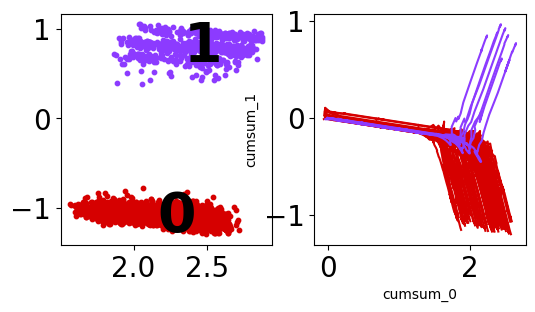

In [24]:
figs = []

fig, ax = plt.subplots(1,2, figsize=(6,3))
phlower.pl.plot_trajs_embedding(adata, clusters="trajs_clusters",show_legend=False, labelsize=40, node_size=10, ax=ax[0])
phlower.pl.plot_trajectory_harmonic_lines(adata, sample_ratio=0.01, show_legend=False, ax=ax[1]) 

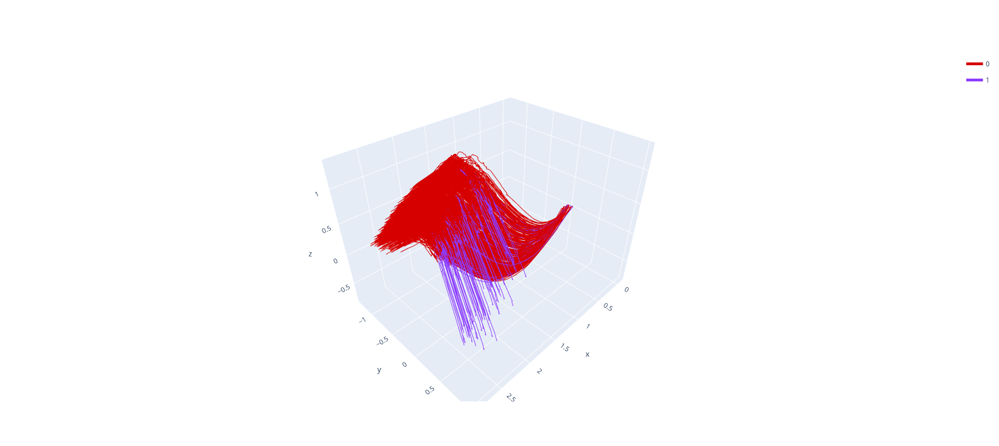

In [25]:
phlower.pl.plot_trajectory_harmonic_lines_3d(adata, sample_ratio=.1, show_legend=True, fig_path=None) 

3


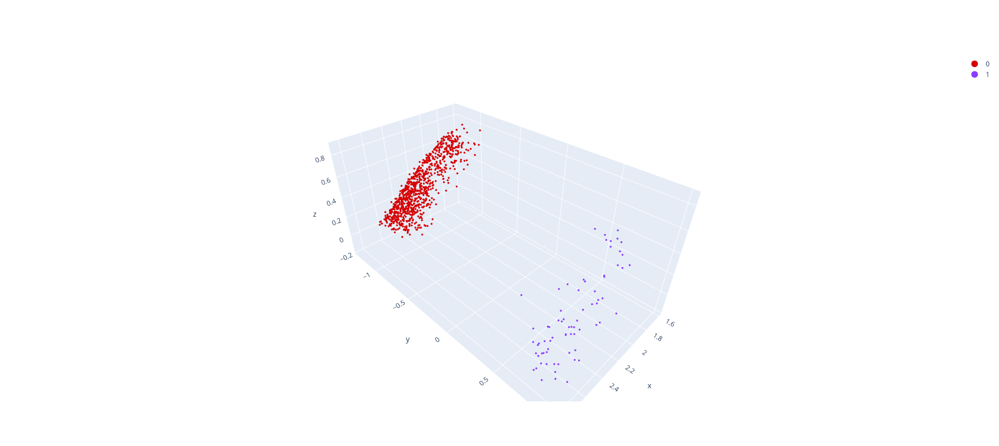

In [26]:
phlower.pl.plot_trajectory_harmonic_points_3d(adata, sample_ratio=.1, show_legend=True, fig_path=None) 


We also visualize the trajectories using velocity stream plots.

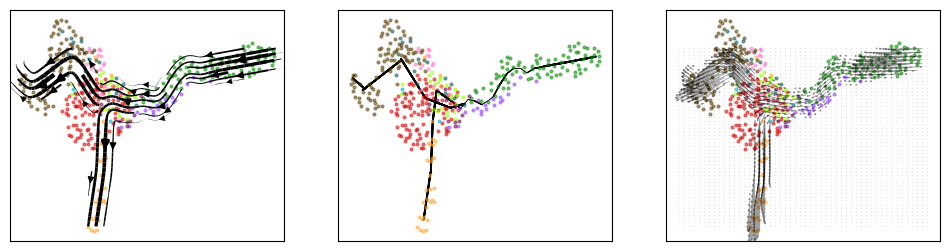

In [27]:
figs = []
fig, ax = plt.subplots(1,3, figsize=(12, 3))
phlower.pl.fate_velocity_plot(adata, group_name='group',figtype='stream', ax=ax[0], show_legend=False, radius=100, maxlinewidth=10, embedd_label=False)
phlower.pl.fate_velocity_plot(adata, group_name='group',node_alpha=.5,figtype='point', ax=ax[1], show_legend=False, embedd_label=False)
phlower.pl.fate_velocity_plot(adata, group_name='group',node_alpha=.5,figtype='grid', ax=ax[2], show_legend=False, embedd_label=False, radius=100)

Pie plots shows the cell type ratio changing for each trajectory

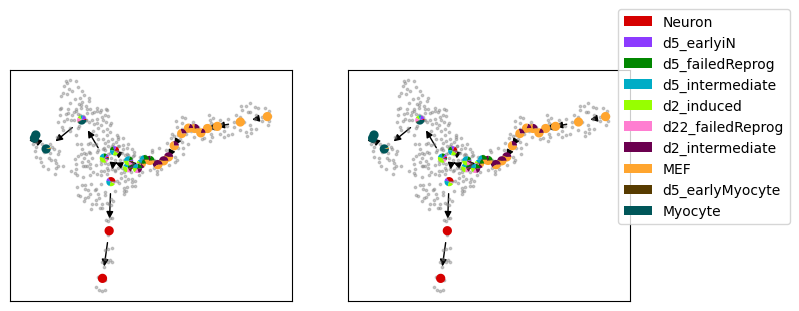

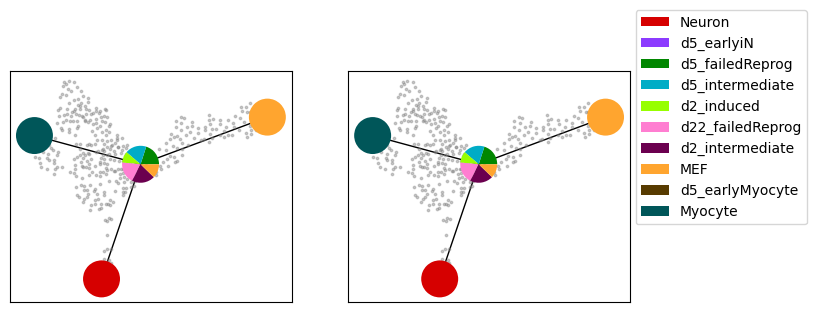

In [28]:
figs = []
fig, ax =  plt.subplots(1,2, figsize=(8,3))
phlower.pl.plot_pie_fate_tree(adata, fate_tree='fate_tree',piesize=0.05,ax=ax[0],bg_alpha=0.4,)
phlower.pl.plot_pie_fate_tree(adata, fate_tree='fate_tree',piesize=0.05,ax=ax[1],bg_alpha=0.4, show_legend=True, legend_column=1)


fig, ax =  plt.subplots(1,2, figsize=(8,3))
phlower.pl.plot_pie_fate_tree(adata, piesize=0.2, ax=ax[0],bg_alpha=0.4)
phlower.pl.plot_pie_fate_tree(adata, piesize=0.2, ax=ax[1],bg_alpha=0.4, show_legend=True, legend_column=1)

Leaf markers and transition markers

In [29]:
phlower.ext.detect_leaf_markers(adata, use_precomputed=False, n_jobs=50)

Scanning all features ...
Filtering out markers that are expressed in less than 5 cells ...
50 cpus are being used ...
13937 markers are being scanned ...


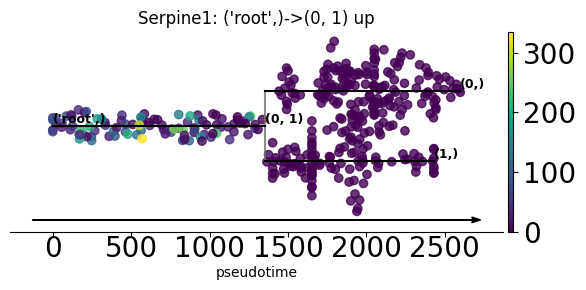

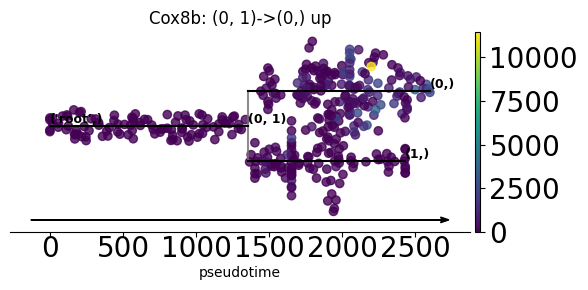

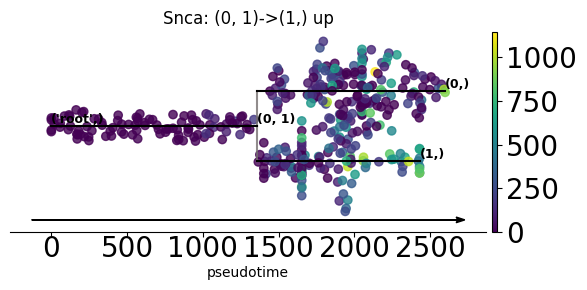

In [34]:
dd = phlower.ext.tree_label_dict(adata)
figs = []
for k, v in adata.uns['leaf_markers'].items():
    k1,k2 = dd.get(k[0], k[0]),dd.get(k[1], k[1])
    up = v[v.zscore>0].index
    dn = v[v.zscore<0].index
    for i in up[:1]:
        title = f"{i}: {k1}->{k2} up"
        fig = phlower.ext.plot_stream_sc(adata, color=[i], show_text=True, show_graph=True, show_legend=False, title=title, fig_size=(6,3), s=100, return_fig=True)
        figs.append(fig)


In [31]:
phlower.ext.detect_transition_markers(adata, use_precomputed=False, n_jobs=50)

Scanning all features ...
Filtering out markers that are expressed in less than 5 cells ...
50 cpus are being used ...
13937 markers are being scanned ...


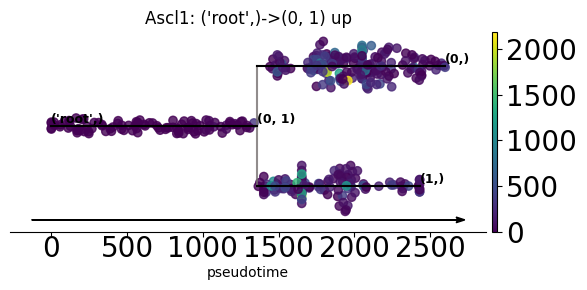

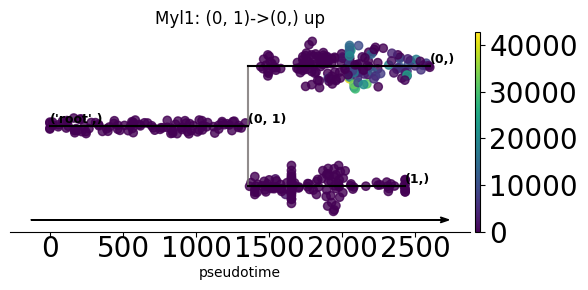

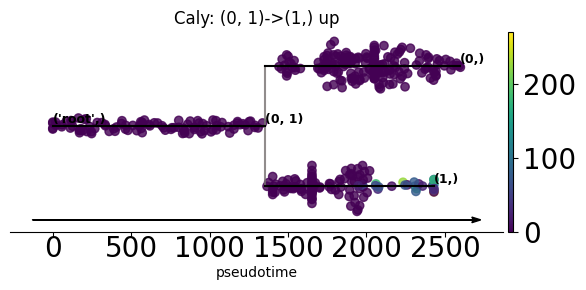

In [33]:
dd = phlower.ext.tree_label_dict(adata)
for k, v in adata.uns['transition_markers'].items():
    #print(v)
    k1,k2 = dd.get(k[0], k[0]),dd.get(k[1], k[1])
    #print(k1,k2)
    up = v[v.stat>0].index
    dn = v[v.stat<0].index
    for i in up[:1]:
        title = f"{i}: {k1}->{k2} up"
        fig = phlower.ext.plot_stream_sc(adata, color=[i], show_text=True, show_graph=True, show_legend=False, title=title, fig_size=(6,3), s=100, return_fig=True,  dist_scale=0.3)